### BUSINESS CASE 1: To Prepare a complete Data Analysis Report on the Rice Leaf Disease Detection Data Set

### Importing/Installing Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import tensorflow as tf
import keras
import random
import os
from glob import glob

from tensorflow.keras import utils
from tensorflow.keras.utils import to_categorical

from sklearn.model_selection import train_test_split

# CNN Architecture
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam

'''Data Augmentation: 
Commonly used in rice leaf disease classification to increase the size and diversity of the training dataset. It involves
applying various transformations to the existing images, creating new augmented versions of the original images.
'''
from tensorflow.keras.preprocessing.image import ImageDataGenerator

'''Keras Tuner
Keras Tuner is a popular hyperparameter optimization library that can be used to automatically search for the 
optimal hyperparameters of a machine learning model.
'''

import keras_tuner
from keras_tuner import RandomSearch
from keras_tuner.engine.hyperparameters import HyperParameters
from keras.layers import Dropout

# Transfer Learning

from keras.applications.vgg16 import VGG16
from keras.applications.inception_v3 import InceptionV3
from keras.applications.resnet_v2 import ResNet152V2
from keras.applications.xception import Xception
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras.callbacks import ReduceLROnPlateau

# Call backs
from tensorflow.keras.callbacks import EarlyStopping

# Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install opencv-python

import cv2

### Domain Analysis

In this project, we aim to develop a Convolutional Neural Network (CNN) model to predict and classify diseases affecting rice plant leaves. 
The primary objective is to identify and differentiate between three common diseases: Bacterial Leaf Blight, Brown Spot, and Leaf Smut. Understanding these diseases is essential for effective pest management and crop protection in agriculture.

Rice (Oryza sativa) is one of the world's most important staple crops, providing sustenance to a significant portion of the global population. However, rice cultivation is often plagued by various diseases, which can significantly reduce crop yield and quality. This project focuses on three specific diseases:

##### Healthy Rice Plant

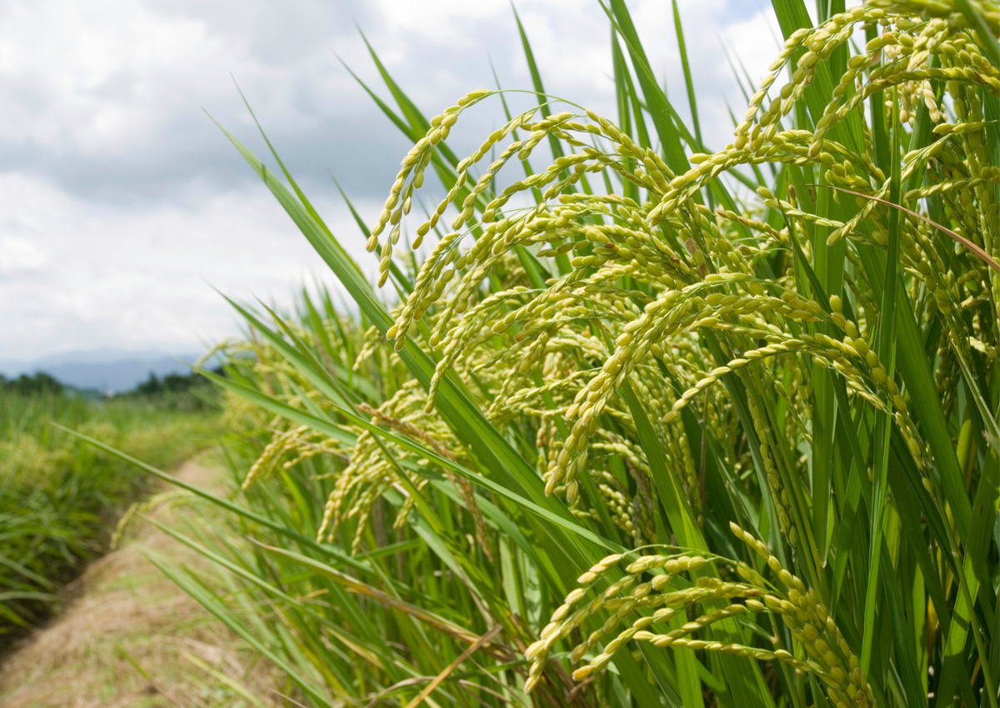

1. **Bacterial Leaf Blight (BLB):** Caused by the bacterium Xanthomonas oryzae, BLB leads to water-soaked lesions on leaves and can severely impact rice production.

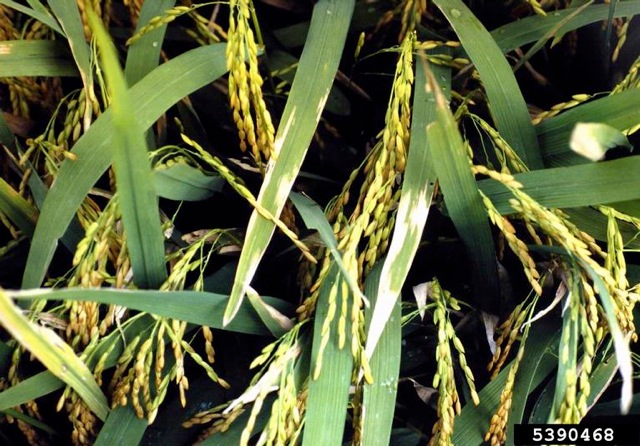

2. **Brown Spot:** Caused by the fungus Cochliobolus miyabeanus, Brown Spot results in small, dark brown
spots on the leaves, affecting photosynthesis and crop health.

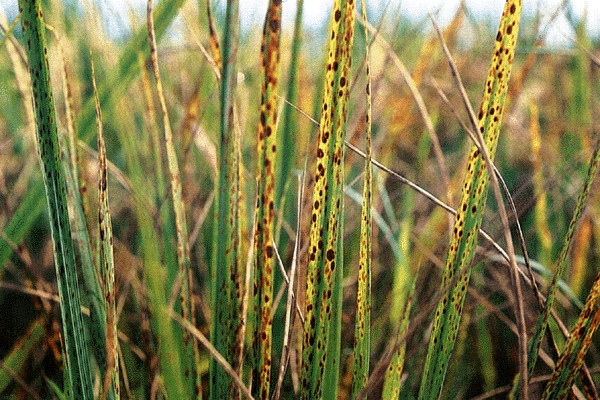

3. **Leaf Smut:** Leaf Smut, caused by the fungus Tilletia barclayana, manifests as black, smut-filled areas
on the leaves, reducing plant vigor and yield.

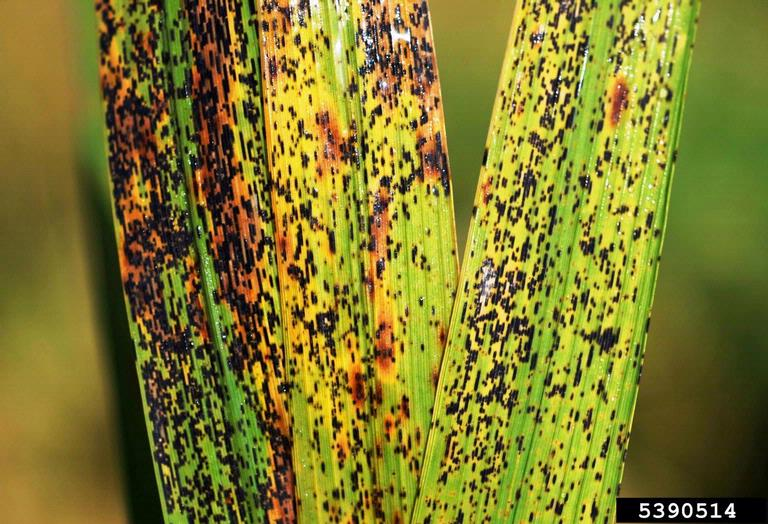

### Uploading the Data Set

In [3]:
# Providing Data Set path

data_dir = r'D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set'

##### To Read the Images from the Folder

#### Bacterial Leaf Blight Images

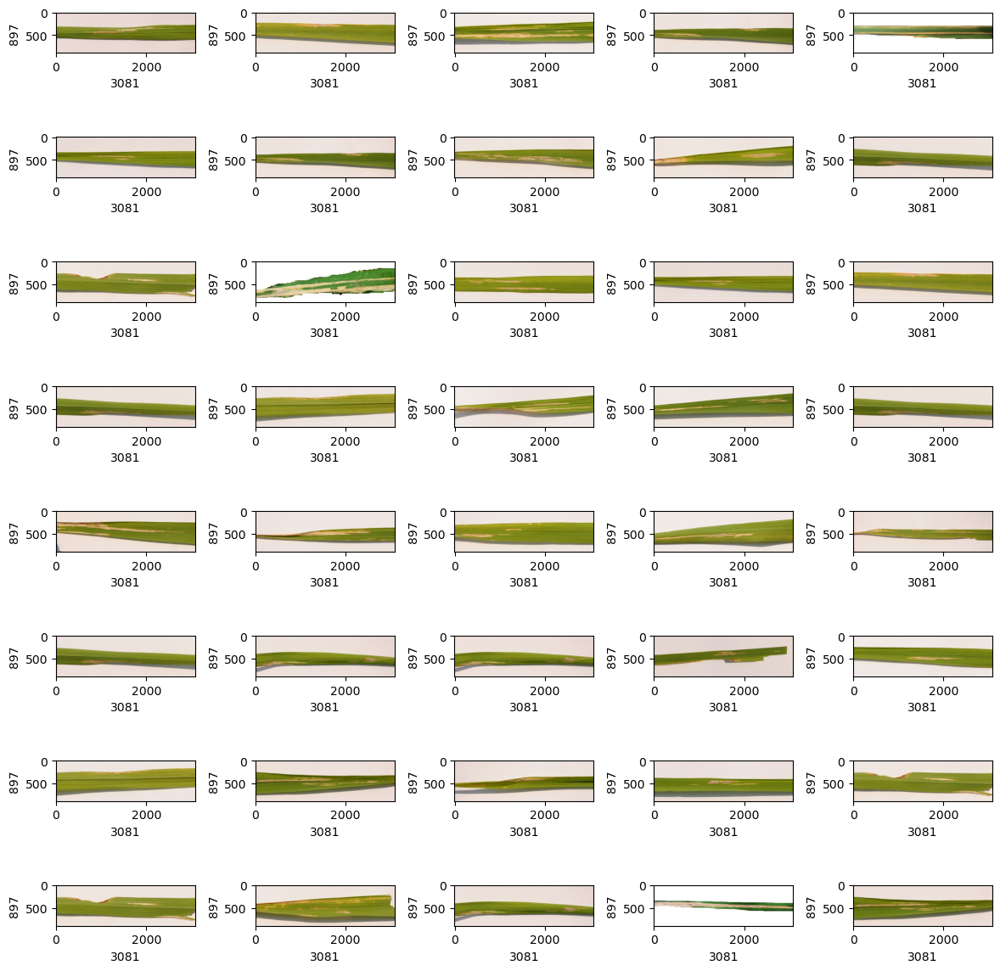

In [4]:
plt.figure(figsize = (12, 12))
blb_image = data_dir + '/Bacterial leaf blight'
for i in range(1, 41):
    plt.subplot(8, 5, i)
    plt.tight_layout()
    rand_img_blb = plt.imread(blb_image +'/'+ random.choice(sorted(os.listdir(blb_image))))
    plt.imshow(rand_img_blb)
    plt.xlabel(rand_img_blb.shape[1], fontsize = 10) # width of image
    plt.ylabel(rand_img_blb.shape[0], fontsize = 10) # height of image

In [5]:
# Checking the size of the Image

rand_img_blb.shape

(897, 3081, 3)

#### Brown Spot Images

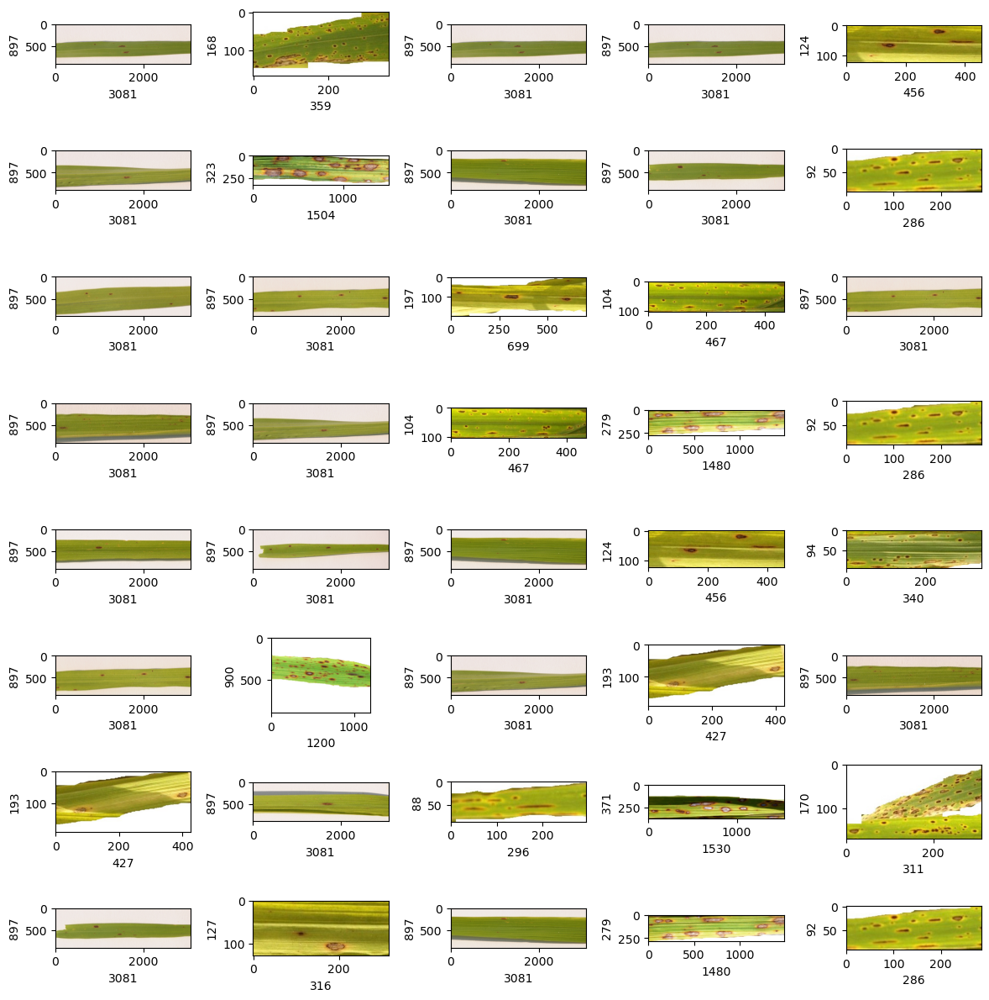

In [6]:
plt.figure(figsize = (12, 12))
bs_image = data_dir + '/Brown spot'
for i in range(1, 41):
    plt.subplot(8, 5, i)
    plt.tight_layout()
    rand_img_bs = plt.imread(bs_image +'/'+ random.choice(sorted(os.listdir(bs_image))))
    plt.imshow(rand_img_bs)
    plt.xlabel(rand_img_bs.shape[1], fontsize = 10) # width of image
    plt.ylabel(rand_img_bs.shape[0], fontsize = 10) # height of image

In [7]:
# Checking the size of the Image

rand_img_bs.shape

(92, 286, 3)

#### Leaf Smut Images

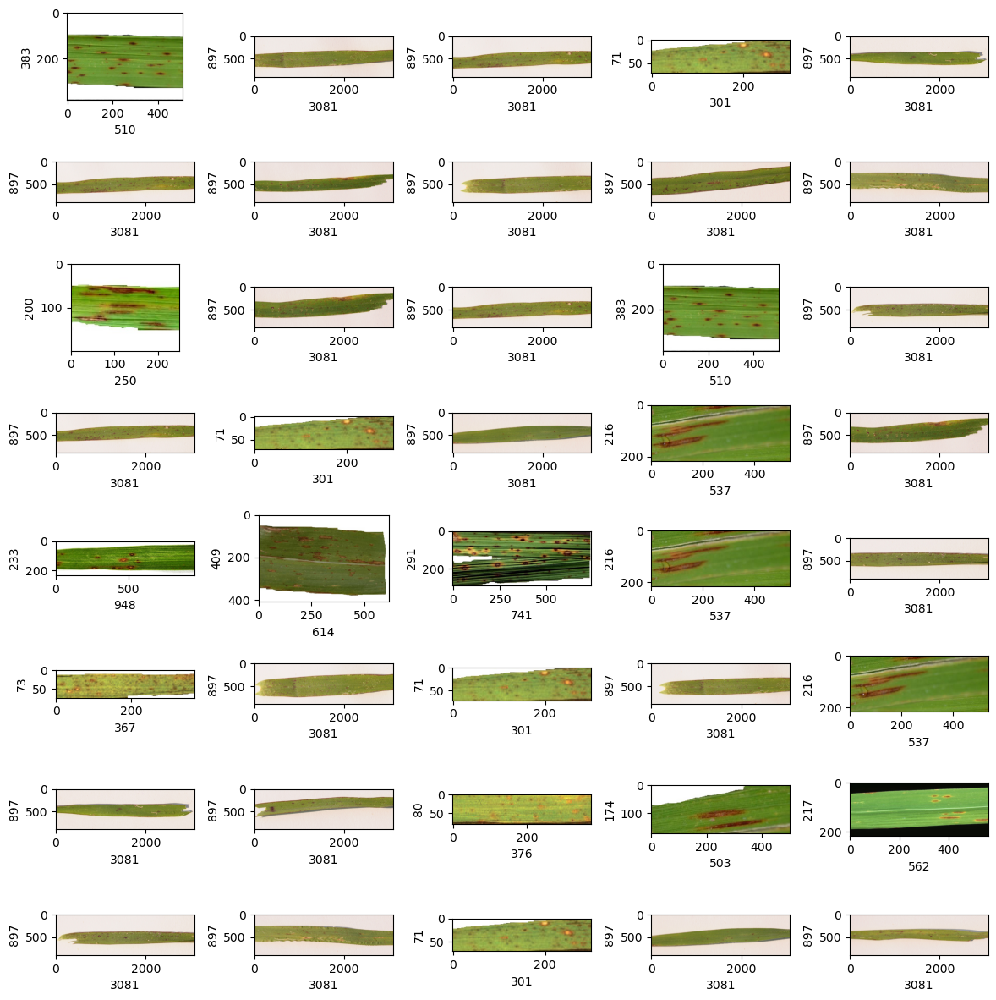

In [8]:
plt.figure(figsize = (12, 12))
ls_image = data_dir + '/Leaf Smut'
for i in range(1, 41):
    plt.subplot(8, 5, i)
    plt.tight_layout()
    rand_img_ls = plt.imread(ls_image +'/'+ random.choice(sorted(os.listdir(ls_image))))
    plt.imshow(rand_img_ls)
    plt.xlabel(rand_img_ls.shape[1], fontsize = 10) # width of image
    plt.ylabel(rand_img_ls.shape[0], fontsize = 10) # height of image

In [9]:
# Checking the size of the Image

rand_img_ls.shape

(897, 3081, 3)

### Exploratory Data Analysis

##### Plotting a graph to see the Number of Images in Each Class of Disease

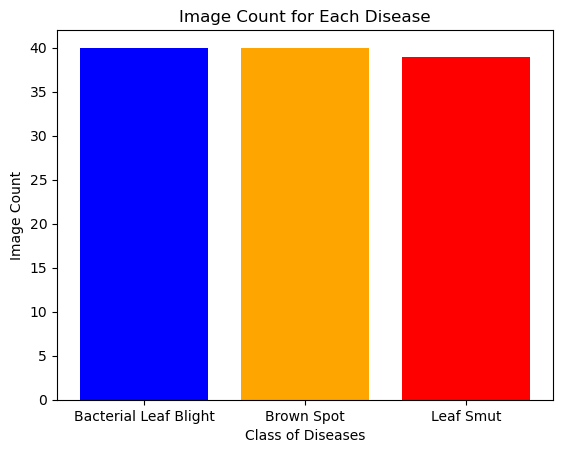

In [10]:
def count_images_in_folder(folder_path):
    valid_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp']  # Add more if needed
    count = 0

    for file_name in os.listdir(folder_path):
        if any(file_name.lower().endswith(ext) for ext in valid_extensions):
            count += 1

    return count

def plot_bar_graph(folder_paths, labels):
    counts = [count_images_in_folder(folder_path) for folder_path in folder_paths]

    plt.bar(labels, counts, color=['blue', 'orange', 'red'])
    plt.xlabel('Class of Diseases')
    plt.ylabel('Image Count')
    plt.title('Image Count for Each Disease')
    plt.show()

if __name__ == "__main__":
    folder_paths = ['D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set\Bacterial leaf blight', 
                    'D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set\Brown spot', 
                    'D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set\Leaf smut']
    labels = ['Bacterial Leaf Blight', 'Brown Spot', 'Leaf Smut']

    plot_bar_graph(folder_paths, labels)

### Reading and Resizing the Images

In [11]:
# Function to read and resize the images

def load_and_resize_images_from_folder(folder, target_size = (224, 224)):
    images = []
    for filename in os.listdir(folder):
        if any([filename.lower().endswith(x) for x in ['.jpeg', '.jpg', '.png']]): # Convert the file extension to lowercase before checking
            img = cv2.imread(os.path.join(folder, filename))
            if img is not None:
                img = cv2.resize(img, target_size)
                class_label = os.path.basename(folder) # Extract the class label from the folder
                images.append((img, class_label)) # Include class label and file name img
    return images

images_dir1 = load_and_resize_images_from_folder(blb_image)
images_dir2 = load_and_resize_images_from_folder(bs_image)
images_dir3 = load_and_resize_images_from_folder(ls_image)

In [12]:
images_dir1[0]

(array([[[210, 215, 229],
         [208, 214, 227],
         [209, 212, 227],
         ...,
         [210, 215, 230],
         [211, 217, 230],
         [211, 216, 229]],
 
        [[208, 214, 226],
         [208, 214, 227],
         [210, 214, 229],
         ...,
         [210, 215, 230],
         [209, 215, 228],
         [210, 215, 231]],
 
        [[209, 214, 228],
         [209, 214, 228],
         [208, 213, 230],
         ...,
         [209, 215, 228],
         [210, 216, 229],
         [211, 215, 233]],
 
        ...,
 
        [[210, 216, 229],
         [207, 215, 228],
         [209, 215, 228],
         ...,
         [210, 214, 225],
         [210, 216, 229],
         [210, 215, 228]],
 
        [[209, 215, 228],
         [207, 212, 227],
         [209, 216, 229],
         ...,
         [210, 214, 225],
         [209, 215, 229],
         [209, 215, 228]],
 
        [[208, 213, 227],
         [211, 214, 229],
         [209, 216, 229],
         ...,
         [211, 214, 227],
  

In [13]:
images_dir2[0]

(array([[[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [255, 255, 255],
         [255, 255, 255],
         [255, 255, 255]],
 
        ...,
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [ 74, 184, 169],
         [ 72, 187, 167],
         [ 73, 184, 165]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [ 65, 180, 163],
         [ 72, 187, 164],
         [ 77, 186, 163]],
 
        [[255, 255, 255],
         [255, 255, 255],
         [255, 255, 255],
         ...,
         [ 68, 186, 167],
  

In [14]:
images_dir3[0]

(array([[[223, 230, 239],
         [222, 228, 239],
         [223, 230, 239],
         ...,
         [208, 220, 239],
         [223, 232, 241],
         [225, 232, 241]],
 
        [[224, 230, 239],
         [223, 229, 240],
         [224, 228, 239],
         ...,
         [221, 229, 243],
         [225, 232, 241],
         [224, 231, 240]],
 
        [[225, 231, 240],
         [223, 229, 240],
         [224, 228, 239],
         ...,
         [225, 232, 241],
         [227, 233, 242],
         [225, 231, 240]],
 
        ...,
 
        [[226, 232, 239],
         [224, 231, 240],
         [226, 230, 241],
         ...,
         [223, 228, 239],
         [222, 228, 239],
         [224, 231, 240]],
 
        [[225, 231, 238],
         [226, 231, 240],
         [226, 231, 240],
         ...,
         [224, 231, 240],
         [222, 228, 239],
         [223, 230, 239]],
 
        [[224, 229, 239],
         [226, 231, 240],
         [226, 232, 239],
         ...,
         [225, 233, 240],
  

### Data Preprocessing

In [15]:
from tensorflow.keras.preprocessing.image import img_to_array

In [16]:
x_image = []
y_label = []

for img, class_label in images_dir1:
    x_image.append(img)
    y_label.append(class_label)

for img, class_label in images_dir2:
    x_image.append(img)
    y_label.append(class_label)

for img, class_label in images_dir3:
    x_image.append(img)
    y_label.append(class_label)

In [17]:
x_image

[array([[[210, 215, 229],
         [208, 214, 227],
         [209, 212, 227],
         ...,
         [210, 215, 230],
         [211, 217, 230],
         [211, 216, 229]],
 
        [[208, 214, 226],
         [208, 214, 227],
         [210, 214, 229],
         ...,
         [210, 215, 230],
         [209, 215, 228],
         [210, 215, 231]],
 
        [[209, 214, 228],
         [209, 214, 228],
         [208, 213, 230],
         ...,
         [209, 215, 228],
         [210, 216, 229],
         [211, 215, 233]],
 
        ...,
 
        [[210, 216, 229],
         [207, 215, 228],
         [209, 215, 228],
         ...,
         [210, 214, 225],
         [210, 216, 229],
         [210, 215, 228]],
 
        [[209, 215, 228],
         [207, 212, 227],
         [209, 216, 229],
         ...,
         [210, 214, 225],
         [209, 215, 229],
         [209, 215, 228]],
 
        [[208, 213, 227],
         [211, 214, 229],
         [209, 216, 229],
         ...,
         [211, 214, 227],
  

In [18]:
y_label

['Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial leaf blight',
 'Bacterial 

##### Converting the Images to Int type - Using Label Encoder

In [19]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

##### Converting Images and labels to Arrays

In [20]:
x_image =np.array(x_image)
y_label = np.array(y_label)

y_encoded = label_encoder.fit_transform(y_label)

In [21]:
y_encoded

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2], dtype=int64)

In [22]:
x_image.shape

(119, 224, 224, 3)

##### Rescaling Images to the of range 0 to 1

In [23]:
x_image = x_image/255.0

### Splitting Data Set Folder into Train, Test and Validation Data (New Folder Named as Data_Splitted)

In [24]:
!pip install split-folders

In [25]:
import splitfolders

path =  r'D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set'

print(os.listdir(path))

['Bacterial leaf blight', 'Brown spot', 'Leaf smut']


In [26]:
path = r'D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set'

splitfolders.ratio(path, seed = 1337, output = "DataSet_Splitted", ratio = (0.6, 0.2, 0.2))

Copying files: 119 files [00:00, 416.52 files/s]


##### Creating Folder Paths for respective Splitted Data Set

In [27]:
train_path = r"D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\DataSet_Splitted\train"

test_path = r"D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\DataSet_Splitted\test"

val_path = r"D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\DataSet_Splitted\val"

In [28]:
folder_path = r"D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\DataSet_Splitted"
all_files_and_folders = os.listdir(folder_path)
subfolders = [f for f in all_files_and_folders if os.path.isdir(os.path.join(folder_path, f))]

print(len(subfolders))

3


In [29]:
folder_path = r"D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\DataSet_Splitted"
subfolders = glob(os.path.join(folder_path, '*'))

print(len(subfolders))

3


##### Setting the Image Size and Batch Size

In [30]:
img_size = (256, 256)

batch_size = 32

##### Rescaling the Train, Validation and Test Data Sets

In [31]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)

val_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255)

##### Creating Data Generators

In [32]:
train_generator = train_datagen.flow_from_directory(train_path, target_size = img_size, 
                                                    batch_size = batch_size, class_mode = 'sparse')

val_generator = val_datagen.flow_from_directory(val_path, target_size = img_size, 
                                                batch_size = batch_size, class_mode = 'sparse')

test_generator = test_datagen.flow_from_directory(test_path, target_size = img_size, 
                                                  batch_size = batch_size, class_mode = 'sparse')

Found 71 images belonging to 3 classes.
Found 23 images belonging to 3 classes.
Found 25 images belonging to 3 classes.


In [33]:
train_generator.class_indices

{'Bacterial leaf blight': 0, 'Brown spot': 1, 'Leaf smut': 2}

### BUSINESS CASE 2: To Create a Model which can Classify the three Major Attacking Diseases of Rice 

#### 1. CONVOLUTIONAL NEURAL NETWORK (CNN) MODEL

##### Creating the Model

In [34]:
model_CNN = Sequential([Conv2D(16, 3, padding = 'same', activation = 'relu', input_shape = (256, 256, 3)), 
                        MaxPooling2D(pool_size = (2, 2)), 
                        
                        Conv2D(32, 3, padding = 'same', activation = 'relu'), 
                        MaxPooling2D(pool_size = (2, 2)), 
                        
                        Conv2D(64, 3, padding = 'same', activation = 'relu'), 
                        MaxPooling2D(pool_size = (2, 2)), 
                        
                        Conv2D(128, 3, padding = 'same', activation = 'relu'), 
                        MaxPooling2D(pool_size = (2, 2)), 
                        
                        Conv2D(256, 3, padding = 'same', activation = 'relu'), 
                        MaxPooling2D(pool_size = (2, 2)), 
                        
                        Conv2D(512, 3, padding = 'same', activation = 'relu'), 
                        MaxPooling2D(pool_size = (2, 2)), 
                        
                        # Flattening
                        Flatten(), 
                        
                        # Fully Connected Layer 
                        Dense(700, activation='relu'), 
                        
                        # Deactivating 40% neurons 
                        Dropout(0.4), 
                        
                        # Correcting the output layer for multi-class classification 
                        Dense(3, activation='softmax')])

In [35]:
# Layers

model_CNN.layers

In [36]:
# Summary

model_CNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 16)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 32, 32, 64)        0

##### Compiling the Model

In [37]:
model_CNN.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])

##### Training the Model

In [38]:
history_CNN = model_CNN.fit(train_generator, epochs = 50, batch_size = 32, validation_data = val_generator) 

Epoch 1/50
3/3 [==============================] - 12s 3s/step - loss: 1.1449 - accuracy: 0.2817 - val_loss: 1.0939 - val_accuracy: 0.3478
Epoch 2/50
3/3 [==============================] - 7s 3s/step - loss: 1.0995 - accuracy: 0.3944 - val_loss: 1.0871 - val_accuracy: 0.3478
Epoch 3/50
3/3 [==============================] - 7s 2s/step - loss: 1.0879 - accuracy: 0.3380 - val_loss: 1.0631 - val_accuracy: 0.3478
Epoch 4/50
3/3 [==============================] - 7s 2s/step - loss: 1.0461 - accuracy: 0.3380 - val_loss: 1.0276 - val_accuracy: 0.3478
Epoch 5/50
3/3 [==============================] - 7s 2s/step - loss: 0.9694 - accuracy: 0.4930 - val_loss: 0.9402 - val_accuracy: 0.5217
Epoch 6/50
3/3 [==============================] - 7s 3s/step - loss: 0.8549 - accuracy: 0.6761 - val_loss: 0.8409 - val_accuracy: 0.6522
Epoch 7/50
3/3 [==============================] - 6s 2s/step - loss: 0.7755 - accuracy: 0.7183 - val_loss: 0.8214 - val_accuracy: 0.6522
Epoch 8/50
3/3 [========================

##### Evaluating the Model on the Train Data Set

In [39]:
train_loss_CNN, train_accuracy_CNN = model_CNN.evaluate(train_generator)

print(f"Train Loss for CNN Model is: {train_loss_CNN * 100:.2f}%")
print(f"Train Accuracy for CNN Model is: {train_accuracy_CNN * 100:.2f}%")

3/3 [==============================] - 4s 1s/step - loss: 0.0941 - accuracy: 0.9577
Train Loss for CNN Model is: 9.41%
Train Accuracy for CNN Model is: 95.77%


In [40]:
def plots(imgs, figsize = (30, 25), rows = 10, interp = False, title = None):
    f = plt.figure(figsize = figsize)
    cols = len(imgs) // rows + (len(imgs) % rows > 0)
    
    for i in range(len(imgs)):
        sp = f.add_subplot(rows, cols, i + 1)
        sp.axis('off')

        class_index = int(title[i])
        sp.set_title(class_names[class_index], fontsize = 16)
        plt.imshow(imgs[i])

class_names = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

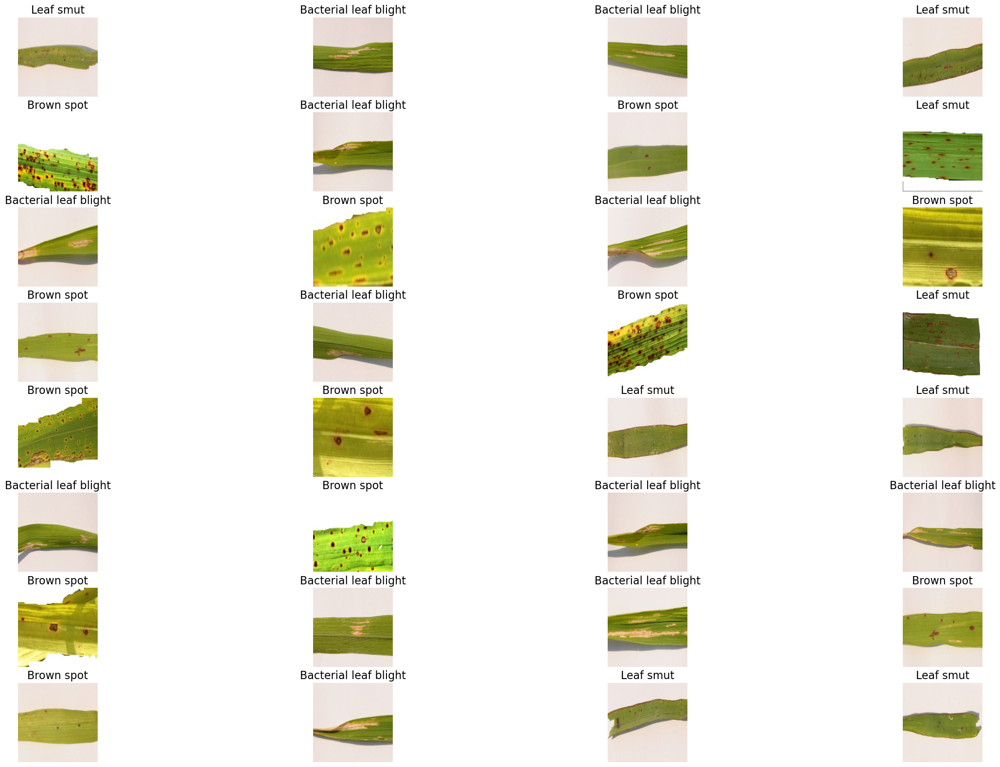

In [41]:
imgs, labels = next(train_generator)
plots(imgs, title = labels)

##### Evaluating the Model on the Validation Data Set

In [42]:
val_loss_CNN, val_accuracy_CNN = model_CNN.evaluate(val_generator)

print(f"Validation Loss for CNN Model is: {val_loss_CNN * 100:.2f}%")
print(f"Validation Accuracy for CNN Model is: {val_accuracy_CNN * 100:.2f}%")

1/1 [==============================] - 2s 2s/step - loss: 1.2776 - accuracy: 0.7826
Validation Loss for CNN Model is: 127.76%
Validation Accuracy for CNN Model is: 78.26%


##### Plotting Training Vs Validation Set for Accuracy and Loss

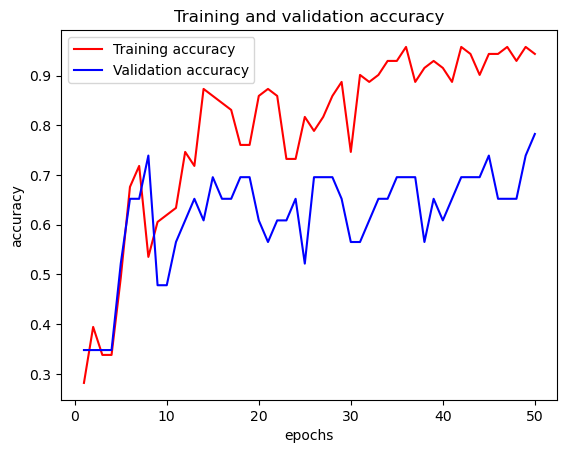

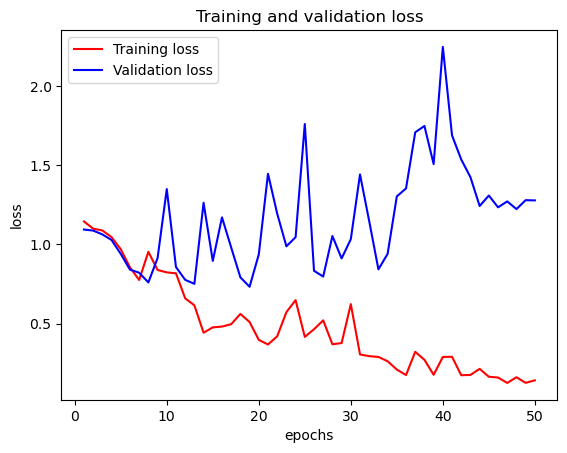

In [43]:
import matplotlib.pyplot as plt

accuracy = history_CNN.history["accuracy"]
val_accuracy = history_CNN.history["val_accuracy"]
loss = history_CNN.history["loss"]
val_loss = history_CNN.history["val_loss"]

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, accuracy, "r", label = "Training accuracy")
plt.plot(epochs, val_accuracy, "b", label = "Validation accuracy")

plt.title("Training and validation accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.legend()
plt.figure()

plt.plot(epochs, loss, "r", label = "Training loss")
plt.plot(epochs, val_loss, "b", label = "Validation loss")

plt.title("Training and validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

##### Evaluating the Model on the Test Data Set

In [44]:
test_loss_CNN, test_accuracy_CNN = model_CNN.evaluate(test_generator)

print(f"Test Loss for CNN Model is: {test_loss_CNN * 100:.2f}%")
print(f"Test Accuracy for CNN Model is: {test_accuracy_CNN * 100:.2f}%")

1/1 [==============================] - 2s 2s/step - loss: 2.7357 - accuracy: 0.6400
Test Loss for CNN Model is: 273.57%
Test Accuracy for CNN Model is: 64.00%


### BUSINESS CASE 3: To Analyse various techniques like Hyperparameter Tuning and Data Augmentation to improve the Performance of the Model

#### 2. CONVOLUTIONAL NEURAL NETWORK (CNN) MODEL WITH HYPERPARAMETER TUNING

##### Set the Learning Rate

In [45]:
learning_rate = 0.001

##### Creating the CNN Model After Hyperparameter Tuning

In [46]:
model_CNN_HT = Sequential([Conv2D(32, (3, 3), activation = 'relu', input_shape = (256, 256, 3)),
                           MaxPooling2D(pool_size = (2, 2)), 
                           
                           Conv2D(64, (3, 3), activation = 'relu'), 
                           MaxPooling2D(pool_size = (2, 2)), 
                           
                           Conv2D(128, (3, 3), activation = 'relu'), 
                           MaxPooling2D(pool_size = (2, 2)), 
                           
                           Conv2D(256, (3, 3), activation = 'relu'), 
                           MaxPooling2D(pool_size = (2, 2)),
                           
                           Flatten(), 
                           Dense(128, activation = 'relu'), 
                           Dense(1, activation = 'sigmoid')])

##### Compiling the Model using the Custom Optimizer

In [47]:
optimizer = Adam(learning_rate = learning_rate)

In [48]:
model_CNN_HT.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

##### Training the Model

In [49]:
history_CNN_HT = model_CNN_HT.fit(train_generator, epochs = 50, batch_size = 32, validation_data = val_generator)

Epoch 1/50
3/3 [==============================] - 16s 4s/step - loss: -0.6414 - accuracy: 0.3380 - val_loss: 6.4273 - val_accuracy: 0.3478
Epoch 2/50
3/3 [==============================] - 10s 4s/step - loss: 10.9607 - accuracy: 0.3380 - val_loss: 18.3590 - val_accuracy: 0.3478
Epoch 3/50
3/3 [==============================] - 10s 3s/step - loss: 13.0406 - accuracy: 0.3380 - val_loss: 21.6323 - val_accuracy: 0.3478
Epoch 4/50
3/3 [==============================] - 9s 4s/step - loss: 49.2849 - accuracy: 0.3380 - val_loss: 57.8043 - val_accuracy: 0.3478
Epoch 5/50
3/3 [==============================] - 9s 4s/step - loss: 18.0881 - accuracy: 0.3380 - val_loss: 67.3930 - val_accuracy: 0.3478
Epoch 6/50
3/3 [==============================] - 10s 4s/step - loss: 37.1103 - accuracy: 0.3380 - val_loss: 75.1869 - val_accuracy: 0.3478
Epoch 7/50
3/3 [==============================] - 10s 3s/step - loss: 17.1019 - accuracy: 0.3380 - val_loss: 82.0295 - val_accuracy: 0.3478
Epoch 8/50
3/3 [=======

##### Evaluating the Model on the Train Data Set

In [50]:
train_loss_CNN_HT, train_accuracy_CNN_HT = model_CNN_HT.evaluate(train_generator)

print(f"Train Loss for CNN Model after Hyperparameter Tuning is: {train_loss_CNN_HT * 100:.2f}%")
print(f"Train Accuracy for CNN Model after Hyperparameter Tuning is: {train_accuracy_CNN_HT * 100:.2f}%")

3/3 [==============================] - 4s 1s/step - loss: -59540192.0000 - accuracy: 0.4085
Train Loss for CNN Model after Hyperparameter Tuning is: -5954019200.00%
Train Accuracy for CNN Model after Hyperparameter Tuning is: 40.85%


##### Evaluating the Model on the Validation Data Set

In [51]:
val_loss_CNN_HT, val_accuracy_CNN_HT = model_CNN_HT.evaluate(val_generator)

print(f"Validation Loss for CNN Model after Hyperparameter Tuning is: {val_loss_CNN_HT * 100:.2f}%")
print(f"Validation Accuracy for CNN Model after Hyperparameter Tuning is: {val_accuracy_CNN_HT * 100:.2f}%")

1/1 [==============================] - 2s 2s/step - loss: -6748472.5000 - accuracy: 0.3913
Validation Loss for CNN Model after Hyperparameter Tuning is: -674847250.00%
Validation Accuracy for CNN Model after Hyperparameter Tuning is: 39.13%


In [52]:
def plots(imgs, figsize = (30, 25), rows = 10, interp = False, title = None):
    f = plt.figure(figsize = figsize)
    cols = len(imgs) // rows + (len(imgs) % rows > 0)
    
    for i in range(len(imgs)):
        sp = f.add_subplot(rows, cols, i + 1)
        sp.axis('off')

        class_index = int(title[i])
        sp.set_title(class_names[class_index], fontsize = 16)
        plt.imshow(imgs[i])

class_names = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

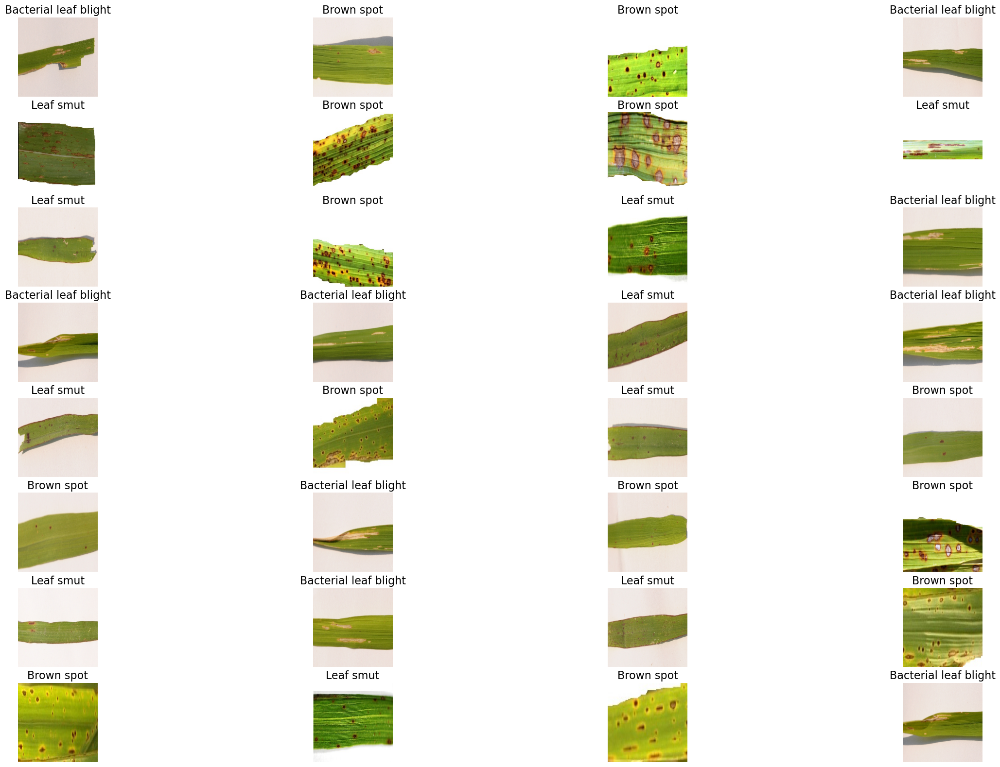

In [53]:
imgs, labels = next(train_generator)
plots(imgs, title = labels)

##### Plotting Training Vs Validation Set for Accuracy and Loss

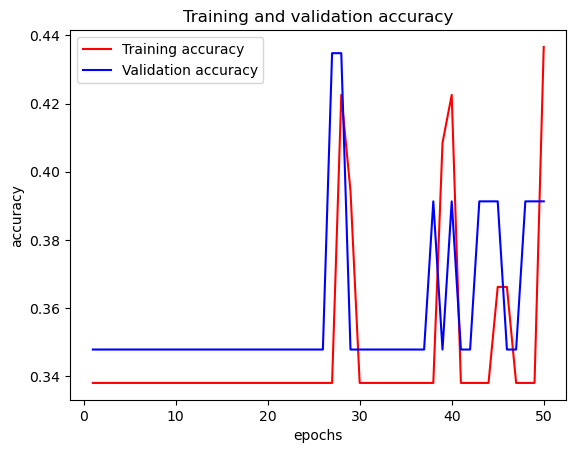

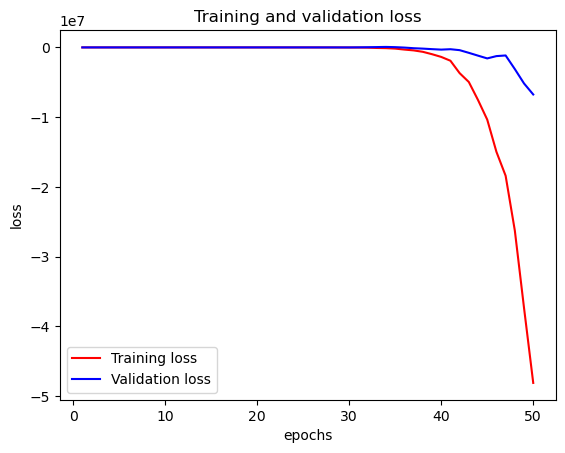

In [54]:
import matplotlib.pyplot as plt

accuracy = history_CNN_HT.history["accuracy"]
val_accuracy = history_CNN_HT.history["val_accuracy"]
loss = history_CNN_HT.history["loss"]
val_loss = history_CNN_HT.history["val_loss"]

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, accuracy, "r", label = "Training accuracy")
plt.plot(epochs, val_accuracy, "b", label = "Validation accuracy")

plt.title("Training and validation accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.legend()
plt.figure()

plt.plot(epochs, loss, "r", label = "Training loss")
plt.plot(epochs, val_loss, "b", label = "Validation loss")

plt.title("Training and validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

##### Evaluating the Model on the Test Data Set

In [55]:
test_loss_CNN_HT, test_accuracy_CNN_HT = model_CNN_HT.evaluate(test_generator)

print(f"Test Loss for CNN Model after Hyperparameter Tuning is: {test_loss_CNN_HT * 100:.2f}%")
print(f"Test Accuracy for CNN Model after Hyperparameter Tuning is: {test_accuracy_CNN_HT * 100:.2f}%")

1/1 [==============================] - 2s 2s/step - loss: -22131980.0000 - accuracy: 0.4000
Test Loss for CNN Model after Hyperparameter Tuning is: -2213198000.00%
Test Accuracy for CNN Model after Hyperparameter Tuning is: 40.00%


#### 3. CONVOLUTIONAL NEURAL NETWORK (CNN) MODEL WITH DATA AUGMENTATION

#### Data Augmentation

##### Rescaling the Train, Validation and Test Data Sets

In [56]:
train_datagen_CNN_DA = ImageDataGenerator(rescale = (1./255), rotation_range = 40, width_shift_range = 0.2, 
                                   height_shift_range = 0.2, fill_mode = 'nearest', shear_range = 0.2, 
                                   zoom_range = 0.2, horizontal_flip = True)

val_datagen_CNN_DA = ImageDataGenerator(rescale = (1./255), rotation_range = 40, width_shift_range = 0.2, 
                                 height_shift_range = 0.2, fill_mode = 'nearest', shear_range = 0.2, 
                                 zoom_range = 0.2, horizontal_flip = True)

test_datagen_CNN_DA = ImageDataGenerator(rescale = (1./255))

##### Creating Data Generators

In [57]:
train_generator_CNN_DA = train_datagen_CNN_DA.flow_from_directory(train_path, target_size = (256, 256), batch_size = 128, 
                                                           class_mode = 'categorical', color_mode = 'rgb')

val_generator_CNN_DA = val_datagen_CNN_DA.flow_from_directory(val_path, target_size = (256, 256), batch_size = 128, 
                                                       class_mode = 'categorical', color_mode = 'rgb')

test_generator_CNN_DA = test_datagen_CNN_DA.flow_from_directory(test_path, target_size = (256, 256), batch_size = 128, 
                                                         class_mode = 'categorical', color_mode = 'rgb')

Found 71 images belonging to 3 classes.
Found 23 images belonging to 3 classes.
Found 25 images belonging to 3 classes.


##### Creating the Model

In [58]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers

model_CNN_DA = Sequential()

model_CNN_DA.add(layers.Conv2D(filters = 32, kernel_size = (3, 3), activation = 'relu', input_shape = (256, 256, 3)))
model_CNN_DA.add(layers.MaxPool2D(pool_size = (2, 2)))

model_CNN_DA.add(layers.Conv2D(filters = 64, kernel_size = (3, 3), activation = 'relu'))
model_CNN_DA.add(layers.MaxPool2D(pool_size = (2, 2)))

model_CNN_DA.add(layers.Conv2D(filters = 128, kernel_size = (3, 3), activation = 'relu'))
model_CNN_DA.add(layers.MaxPool2D(pool_size = (2, 2)))

model_CNN_DA.add(layers.Conv2D(filters = 256, kernel_size = (3, 3), activation = 'relu'))
model_CNN_DA.add(layers.MaxPool2D(pool_size = (2, 2)))

model_CNN_DA.add(layers.Dropout(rate = 0.5))
model_CNN_DA.add(layers.Flatten())
model_CNN_DA.add(layers.Dense(3, activation ='softmax'))

In [59]:
# Layers

model_CNN_DA.layers

In [60]:
# Summary

model_CNN_DA.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 127, 127, 32)      0         
 ng2D)                                                           
                                                                 
 conv2d_11 (Conv2D)          (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_11 (MaxPooli  (None, 62, 62, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_12 (Conv2D)          (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_12 (MaxPooli  (None, 30, 30, 128)      

##### Compiling the Model

In [61]:
model_CNN_DA.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])

##### Training the Model

In [62]:
history_CNN_DA = model_CNN_DA.fit_generator(train_generator_CNN_DA, epochs = 50, validation_data = val_generator_CNN_DA)

Epoch 1/50
1/1 [==============================] - 17s 17s/step - loss: 1.1016 - accuracy: 0.3662 - val_loss: 1.1310 - val_accuracy: 0.3913
Epoch 2/50
1/1 [==============================] - 12s 12s/step - loss: 1.1487 - accuracy: 0.4366 - val_loss: 1.1545 - val_accuracy: 0.3043
Epoch 3/50
1/1 [==============================] - 13s 13s/step - loss: 1.1290 - accuracy: 0.3239 - val_loss: 1.0811 - val_accuracy: 0.3913
Epoch 4/50
1/1 [==============================] - 13s 13s/step - loss: 1.0626 - accuracy: 0.4789 - val_loss: 1.0651 - val_accuracy: 0.3478
Epoch 5/50
1/1 [==============================] - 12s 12s/step - loss: 1.0509 - accuracy: 0.4366 - val_loss: 1.0677 - val_accuracy: 0.3913
Epoch 6/50
1/1 [==============================] - 12s 12s/step - loss: 1.0274 - accuracy: 0.4507 - val_loss: 1.0325 - val_accuracy: 0.4348
Epoch 7/50
1/1 [==============================] - 12s 12s/step - loss: 0.9676 - accuracy: 0.5493 - val_loss: 1.0123 - val_accuracy: 0.4348
Epoch 8/50
1/1 [===========

##### Evaluating the Model on the Train Data Set

In [63]:
train_loss_CNN_DA, train_accuracy_CNN_DA = model_CNN_DA.evaluate(train_generator_CNN_DA)

print(f"Training Loss for CNN Model after Data Augmentation is: {train_loss_CNN_DA * 100:.2f}%")
print(f"Training Accuracy for CNN Model after Data Augmentation is: {train_accuracy_CNN_DA * 100:.2f}%")

1/1 [==============================] - 7s 7s/step - loss: 0.4626 - accuracy: 0.8451
Training Loss for CNN Model after Data Augmentation is: 46.26%
Training Accuracy for CNN Model after Data Augmentation is: 84.51%


##### Evaluating the Model on the Validation Data Set

In [64]:
val_loss_CNN_DA, val_accuracy_CNN_DA = model_CNN_DA.evaluate(val_generator_CNN_DA)

print(f"Validation Loss for CNN Model after Data Augmentation is: {val_loss_CNN_DA * 100:.2f}%")
print(f"Validation Accuracy for CNN Model after Data Augmentation is: {val_accuracy_CNN_DA * 100:.2f}%")

1/1 [==============================] - 2s 2s/step - loss: 0.8696 - accuracy: 0.6957
Validation Loss for CNN Model after Data Augmentation is: 86.96%
Validation Accuracy for CNN Model after Data Augmentation is: 69.57%


In [65]:
def plots(imgs, figsize = (30, 25), rows = 10, interp = False, title = None):
    f = plt.figure(figsize = figsize)
    cols = len(imgs) // rows if len(imgs) % 2 == 0 else len(imgs) // rows + 1
    for i in range(len(imgs)):
        sp = f.add_subplot(rows, cols, i+1)
        sp.axis('off')
        sp.set_title(class_names[title[i].tolist().index(1)], fontsize = 16)
        plt.imshow(imgs[i])

class_names = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

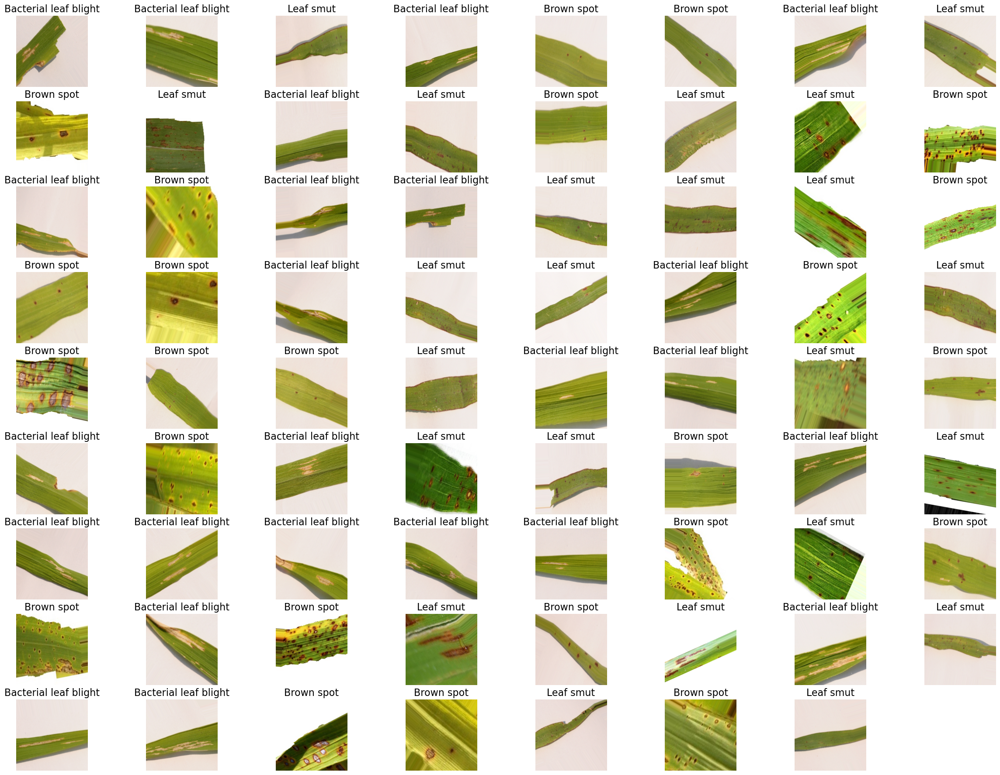

In [66]:
imgs, labels = next(train_generator_CNN_DA)
plots(imgs, title = labels)

##### Plotting Training Vs Validation Set for Accuracy and Loss

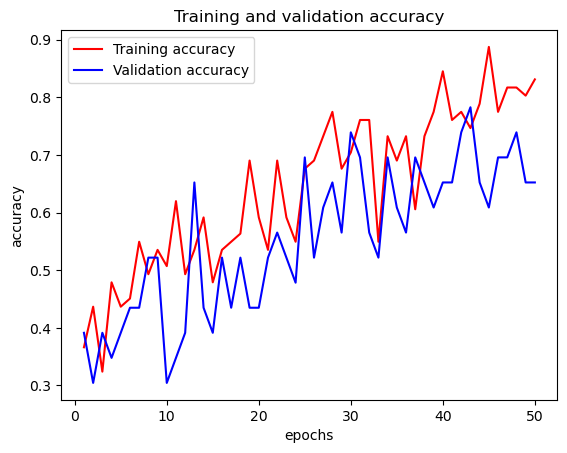

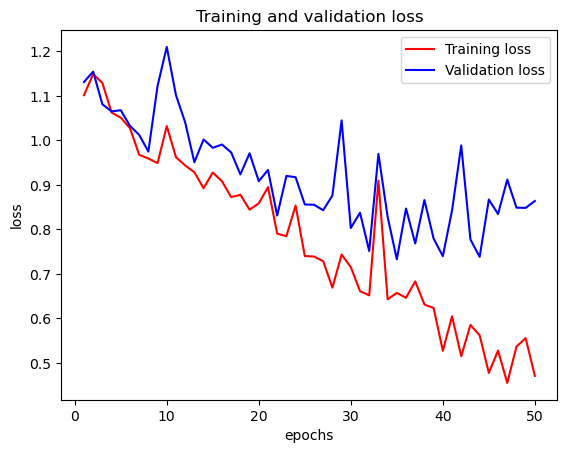

In [67]:
import matplotlib.pyplot as plt

accuracy = history_CNN_DA.history["accuracy"]
val_accuracy = history_CNN_DA.history["val_accuracy"]
loss = history_CNN_DA.history["loss"]
val_loss = history_CNN_DA.history["val_loss"]

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, accuracy, "r", label = "Training accuracy")
plt.plot(epochs, val_accuracy, "b", label = "Validation accuracy")

plt.title("Training and validation accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.legend()
plt.figure()

plt.plot(epochs, loss, "r", label = "Training loss")
plt.plot(epochs, val_loss, "b", label = "Validation loss")

plt.title("Training and validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

##### Evaluating the Model on the Test Data Set

In [68]:
test_loss_CNN_DA, test_accuracy_CNN_DA = model_CNN_DA.evaluate(test_generator_CNN_DA)

print(f"Test Loss for CNN Model after Data Augmentation is: {test_loss_CNN_DA * 100:.2f}%")
print(f"Test Accuracy for CNN Model after Data Augmentation is: {test_accuracy_CNN_DA * 100:.2f}%")

1/1 [==============================] - 2s 2s/step - loss: 1.3936 - accuracy: 0.6800
Test Loss for CNN Model after Data Augmentation is: 139.36%
Test Accuracy for CNN Model after Data Augmentation is: 68.00%


#### 4. VGG16 MODEL

##### Creating the VGG16 Model

In [69]:
base_model = VGG16(weights = 'imagenet', include_top = False, input_shape = (256, 256, 3))

for layer in base_model.layers:
    layer.trainable = False

model_VGG16 = Sequential()
model_VGG16.add(base_model)
model_VGG16.add(Flatten())
model_VGG16.add(Dense(256, activation='relu'))
model_VGG16.add(Dropout(0.5))
model_VGG16.add(Dense(3, activation='softmax'))

In [70]:
# Layers

model_VGG16.layers

In [71]:
# Summary

model_VGG16.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 8, 8, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 32768)             0         
                                                                 
 dense_5 (Dense)             (None, 256)               8388864   
                                                                 
 dropout_2 (Dropout)         (None, 256)               0         
                                                                 
 dense_6 (Dense)             (None, 3)                 771       
                                                                 
Total params: 23104323 (88.14 MB)
Trainable params: 8389635 (32.00 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


##### Compiling the Model 

In [72]:
model_VGG16.compile(loss = 'sparse_categorical_crossentropy', optimizer = Adam(), metrics = ['accuracy'])

##### Training the Model

In [73]:
history_VGG16 = model_VGG16.fit(train_generator, epochs = 50, validation_data = val_generator)

Epoch 1/50
3/3 [==============================] - 31s 10s/step - loss: 4.7778 - accuracy: 0.3380 - val_loss: 3.4110 - val_accuracy: 0.3478
Epoch 2/50
3/3 [==============================] - 29s 13s/step - loss: 3.4483 - accuracy: 0.3944 - val_loss: 2.5476 - val_accuracy: 0.5217
Epoch 3/50
3/3 [==============================] - 30s 9s/step - loss: 2.7080 - accuracy: 0.4930 - val_loss: 1.2469 - val_accuracy: 0.6087
Epoch 4/50
3/3 [==============================] - 29s 9s/step - loss: 1.8381 - accuracy: 0.6761 - val_loss: 1.1509 - val_accuracy: 0.6522
Epoch 5/50
3/3 [==============================] - 32s 10s/step - loss: 1.0383 - accuracy: 0.8169 - val_loss: 0.8193 - val_accuracy: 0.7826
Epoch 6/50
3/3 [==============================] - 30s 10s/step - loss: 0.5667 - accuracy: 0.8732 - val_loss: 0.9368 - val_accuracy: 0.6957
Epoch 7/50
3/3 [==============================] - 30s 10s/step - loss: 0.3244 - accuracy: 0.9014 - val_loss: 0.6815 - val_accuracy: 0.7391
Epoch 8/50
3/3 [=============

##### Evaluating the Model on the Train Data Set

In [74]:
train_loss_VGG16, train_accuracy_VGG16 = model_VGG16.evaluate(train_generator)

print(f"Training Loss for VGG16 Model is: {train_loss_VGG16 * 100:.2f}%")
print(f"Training Accuracy for VGG16 Model is: {train_accuracy_VGG16 * 100:.2f}%")

3/3 [==============================] - 27s 7s/step - loss: 1.7976e-04 - accuracy: 1.0000
Training Loss for VGG16 Model is: 0.02%
Training Accuracy for VGG16 Model is: 100.00%


##### Evaluating the Model on the Validation Data Set

In [75]:
val_loss_VGG16, val_accuracy_VGG16 = model_VGG16.evaluate(val_generator)

print(f"Validation Loss for VGG16 Model is: {val_loss_VGG16 * 100:.2f}%")
print(f"Validation Accuracy for VGG16 Model is: {val_accuracy_VGG16 * 100:.2f}%")

1/1 [==============================] - 11s 11s/step - loss: 0.5494 - accuracy: 0.8261
Validation Loss for VGG16 Model is: 54.94%
Validation Accuracy for VGG16 Model is: 82.61%


In [76]:
def plots(imgs, figsize = (30, 25), rows = 10, interp = False, title = None):
    f = plt.figure(figsize = figsize)
    cols = len(imgs) // rows + (len(imgs) % rows > 0)
    
    for i in range(len(imgs)):
        sp = f.add_subplot(rows, cols, i + 1)
        sp.axis('off')

        class_index = int(title[i])
        sp.set_title(class_names[class_index], fontsize = 16)
        plt.imshow(imgs[i])

class_names = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

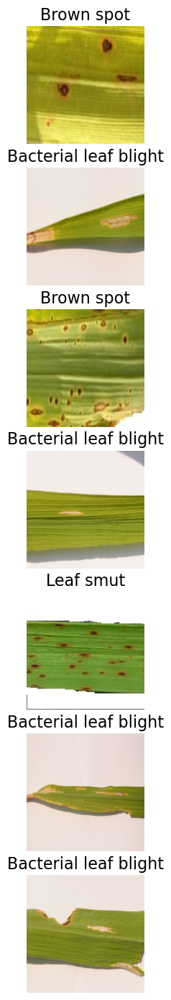

In [77]:
imgs, labels = next(train_generator)
plots(imgs, title = labels)

##### Plotting Training Vs Validation Set for Accuracy and Loss

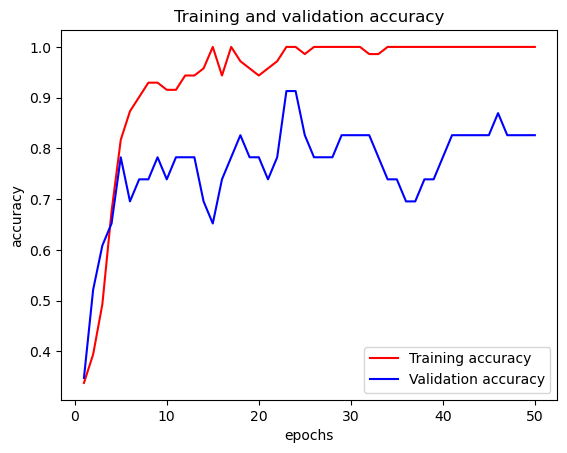

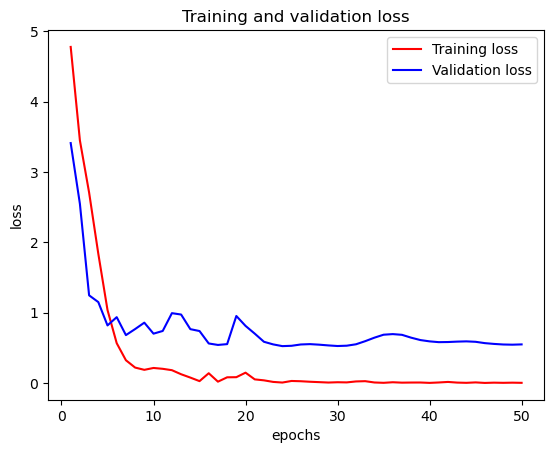

In [78]:
import matplotlib.pyplot as plt

accuracy = history_VGG16.history["accuracy"]
val_accuracy = history_VGG16.history["val_accuracy"]
loss = history_VGG16.history["loss"]
val_loss = history_VGG16.history["val_loss"]

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, accuracy, "r", label = "Training accuracy")
plt.plot(epochs, val_accuracy, "b", label = "Validation accuracy")

plt.title("Training and validation accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.legend()
plt.figure()

plt.plot(epochs, loss, "r", label = "Training loss")
plt.plot(epochs, val_loss, "b", label = "Validation loss")

plt.title("Training and validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

##### Evaluating the Model on the Test Data Set

In [79]:
test_loss_VGG16, test_accuracy_VGG16 = model_VGG16.evaluate(test_generator)

print(f"Test Loss for VGG16 Model is: {test_loss_VGG16 * 100:.2f}%")
print(f"Test Accuracy for VGG16 Model is: {test_accuracy_VGG16 * 100:.2f}%")

1/1 [==============================] - 12s 12s/step - loss: 0.8803 - accuracy: 0.7600
Test Loss for VGG16 Model is: 88.03%
Test Accuracy for VGG16 Model is: 76.00%


#### 5. VGG19 MODEL

##### Creating the VGG19 Model

In [80]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Sequential

# Load pre-trained VGG19 model

base_model = VGG19(weights = 'imagenet', include_top = False, input_shape = (256, 256, 3))

# Freeze the layers of the pre-trained model

for layer in base_model.layers:
    layer.trainable = False

model_VGG19 = Sequential()
model_VGG19.add(base_model)
model_VGG19.add(GlobalAveragePooling2D())
model_VGG19.add(Dense(128, activation = 'relu'))
model_VGG19.add(Dense(1, activation = 'sigmoid'))

In [81]:
# Layers

model_VGG19.layers

In [82]:
# Summary

model_VGG19.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 8, 8, 512)         20024384  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_7 (Dense)             (None, 128)               65664     
                                                                 
 dense_8 (Dense)             (None, 1)                 129       
                                                                 
Total params: 20090177 (76.64 MB)
Trainable params: 65793 (257.00 KB)
Non-trainable params: 20024384 (76.39 MB)
_________________________________________________________________


##### Compiling the Model 

In [83]:
model_VGG19.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

##### Training the Model

In [84]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

steps_per_epoch = train_generator.samples // batch_size

history_VGG19 = model_VGG19.fit(train_generator, epochs = 50, batch_size = 32, 
                                validation_data = val_generator, steps_per_epoch = steps_per_epoch)

Epoch 1/50
2/2 [==============================] - 39s 18s/step - loss: 0.4339 - accuracy: 0.2821 - val_loss: 0.2671 - val_accuracy: 0.3478
Epoch 2/50
2/2 [==============================] - 41s 26s/step - loss: 0.3047 - accuracy: 0.3281 - val_loss: 0.2067 - val_accuracy: 0.3478
Epoch 3/50
2/2 [==============================] - 43s 26s/step - loss: 0.0771 - accuracy: 0.3594 - val_loss: 0.1564 - val_accuracy: 0.3478
Epoch 4/50
2/2 [==============================] - 43s 27s/step - loss: 0.0205 - accuracy: 0.3594 - val_loss: 0.1253 - val_accuracy: 0.3478
Epoch 5/50
2/2 [==============================] - 33s 17s/step - loss: -0.6281 - accuracy: 0.3590 - val_loss: 0.1115 - val_accuracy: 0.3478
Epoch 6/50
2/2 [==============================] - 33s 29s/step - loss: -0.1353 - accuracy: 0.3590 - val_loss: 0.1115 - val_accuracy: 0.3478
Epoch 7/50
2/2 [==============================] - 44s 27s/step - loss: 0.0302 - accuracy: 0.3438 - val_loss: 0.1081 - val_accuracy: 0.3478
Epoch 8/50
2/2 [=========

##### Evaluating the Model on the Train Data Set

In [85]:
train_loss_VGG19, train_accuracy_VGG19 = model_VGG19.evaluate(train_generator)

print(f"Training Loss for VGG19 Model is: {train_loss_VGG19 * 100:.2f}%")
print(f"Training Accuracy for VGG19 Model is: {train_accuracy_VGG19 * 100:.2f}%")

3/3 [==============================] - 14s 4s/step - loss: -1.2756 - accuracy: 0.3380
Training Loss for VGG19 Model is: -127.56%
Training Accuracy for VGG19 Model is: 33.80%


##### Evaluating the Model on the Validation Data Set

In [86]:
val_loss_VGG19, val_accuracy_VGG19 = model_VGG19.evaluate(val_generator)

print(f"Validation Loss for VGG19 Model is: {val_loss_VGG19 * 100:.2f}%")
print(f"Validation Accuracy for VGG19 Model is: {val_accuracy_VGG19 * 100:.2f}%")

1/1 [==============================] - 4s 4s/step - loss: -0.7201 - accuracy: 0.3478
Validation Loss for VGG19 Model is: -72.01%
Validation Accuracy for VGG19 Model is: 34.78%


In [87]:
def plots(imgs, figsize = (30, 25), rows = 10, interp = False, title = None):
    f = plt.figure(figsize = figsize)
    cols = len(imgs) // rows + (len(imgs) % rows > 0)
    
    for i in range(len(imgs)):
        sp = f.add_subplot(rows, cols, i + 1)
        sp.axis('off')

        class_index = int(title[i])
        sp.set_title(class_names[class_index], fontsize = 16)
        plt.imshow(imgs[i])

class_names = ['Bacterial leaf blight', 'Brown spot', 'Leaf smut']

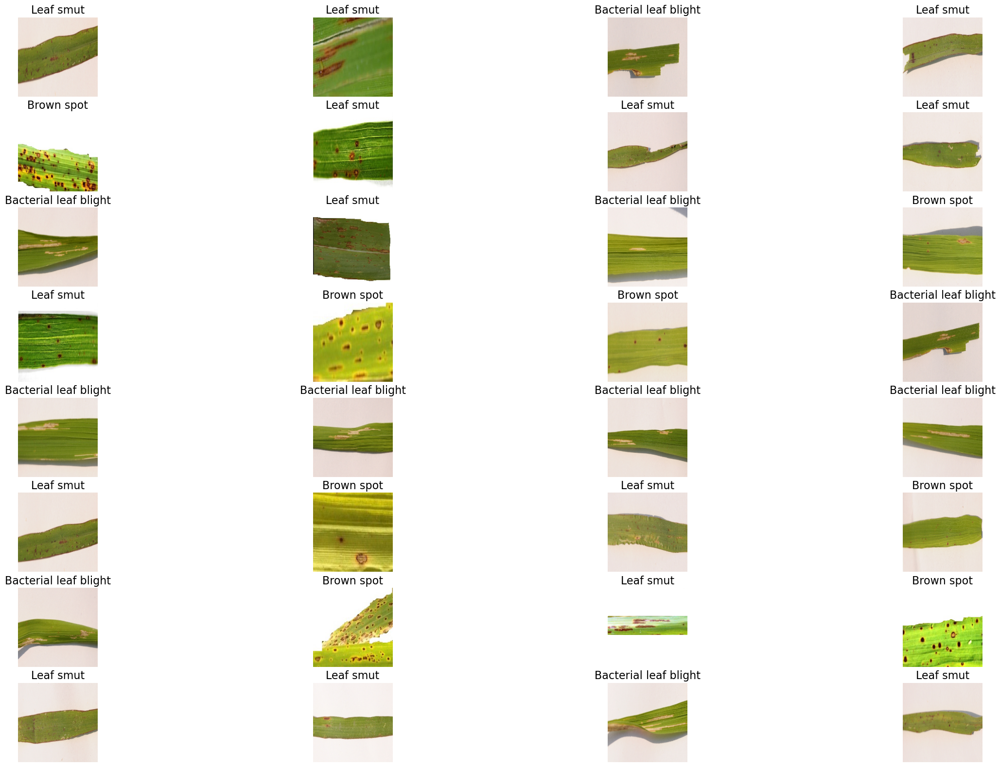

In [88]:
imgs, labels = next(train_generator)
plots(imgs, title = labels)

##### Plotting Training Vs Validation Set for Accuracy and Loss

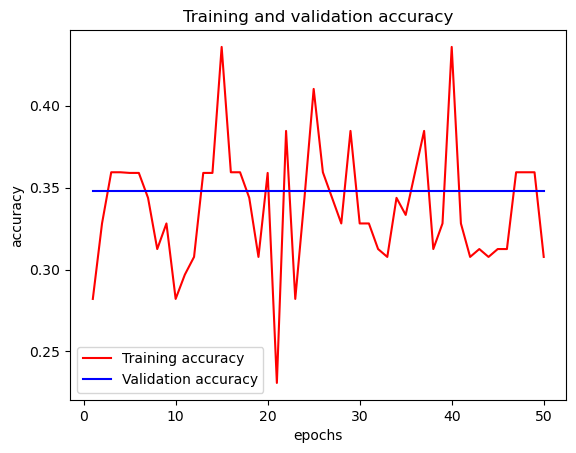

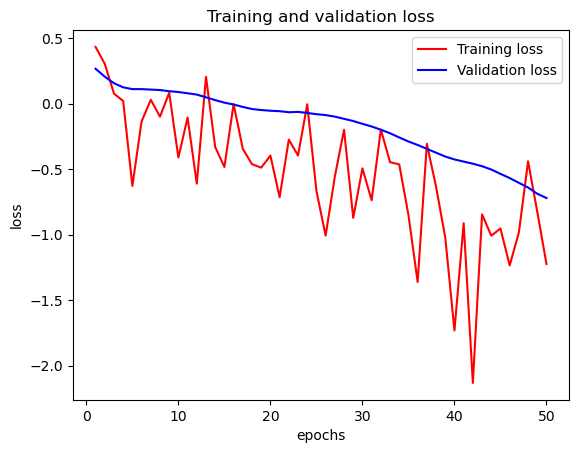

In [89]:
import matplotlib.pyplot as plt

accuracy = history_VGG19.history["accuracy"]
val_accuracy = history_VGG19.history["val_accuracy"]
loss = history_VGG19.history["loss"]
val_loss = history_VGG19.history["val_loss"]

epochs = range(1, len(accuracy) + 1)

plt.plot(epochs, accuracy, "r", label = "Training accuracy")
plt.plot(epochs, val_accuracy, "b", label = "Validation accuracy")

plt.title("Training and validation accuracy")
plt.xlabel("epochs")
plt.ylabel("accuracy")
plt.legend()
plt.figure()

plt.plot(epochs, loss, "r", label = "Training loss")
plt.plot(epochs, val_loss, "b", label = "Validation loss")

plt.title("Training and validation loss")
plt.xlabel("epochs")
plt.ylabel("loss")
plt.legend()
plt.show()

##### Evaluating the Model on the Test Data Set

In [90]:
test_loss_VGG19, test_accuracy_VGG19 = model_VGG19.evaluate(test_generator)

print(f"Test Loss for VGG19 Model is: {test_loss_VGG19 * 100:.2f}%")
print(f"Test Accuracy for VGG19 Model is: {test_accuracy_VGG19 * 100:.2f}%")

1/1 [==============================] - 5s 5s/step - loss: -1.2269 - accuracy: 0.3200
Test Loss for VGG19 Model is: -122.69%
Test Accuracy for VGG19 Model is: 32.00%


### Displaying the Train Accuracy Score for the Algorithms

In [91]:
scores = [train_accuracy_CNN, train_accuracy_CNN_HT, train_accuracy_CNN_DA, train_accuracy_VGG16, train_accuracy_VGG19]

algorithms = ["CNN", "CNN_Hyperparameter Tuning", "CNN_Data Augmentation", "VGG16", "VGG19"]

for i in range(len(algorithms)):
    print("The Train Accuracy score achieved using " + algorithms[i] + " is: {:.2f}%".format(scores[i] * 100))

The Train Accuracy score achieved using CNN is: 95.77%
The Train Accuracy score achieved using CNN_Hyperparameter Tuning is: 40.85%
The Train Accuracy score achieved using CNN_Data Augmentation is: 84.51%
The Train Accuracy score achieved using VGG16 is: 100.00%
The Train Accuracy score achieved using VGG19 is: 33.80%


### Displaying the Train Loss Score for the Algorithms

In [92]:
scores = [train_loss_CNN, train_loss_CNN_HT, train_loss_CNN_DA, train_loss_VGG16, train_loss_VGG19]

algorithms = ["CNN", "CNN_Hyperparameter Tuning", "CNN_Data Augmentation", "VGG16", "VGG19"]

for i in range(len(algorithms)): 
    print("The Train Loss score achieved using " + algorithms[i] + " is: {:.2f}%".format(scores[i] * 100))

The Train Loss score achieved using CNN is: 9.41%
The Train Loss score achieved using CNN_Hyperparameter Tuning is: -5954019200.00%
The Train Loss score achieved using CNN_Data Augmentation is: 46.26%
The Train Loss score achieved using VGG16 is: 0.02%
The Train Loss score achieved using VGG19 is: -127.56%


### Displaying the Validation Accuracy Score for the Algorithms

In [93]:
scores = [val_accuracy_CNN, val_accuracy_CNN_HT, val_accuracy_CNN_DA, val_accuracy_VGG16, val_accuracy_VGG19]

algorithms = ["CNN", "CNN_Hyperparameter Tuning", "CNN_Data Augmentation", "VGG16", "VGG19"]

for i in range(len(algorithms)): 
    print("The Validation Accuracy score achieved using " + algorithms[i] + " is: {:.2f}%".format(scores[i] * 100))

The Validation Accuracy score achieved using CNN is: 78.26%
The Validation Accuracy score achieved using CNN_Hyperparameter Tuning is: 39.13%
The Validation Accuracy score achieved using CNN_Data Augmentation is: 69.57%
The Validation Accuracy score achieved using VGG16 is: 82.61%
The Validation Accuracy score achieved using VGG19 is: 34.78%


### Displaying the Validation Loss Score for the Algorithms

In [94]:
scores = [val_loss_CNN, val_loss_CNN_HT, val_loss_CNN_DA, val_loss_VGG16, val_loss_VGG19]

algorithms = ["CNN", "CNN_Hyperparameter Tuning", "CNN_Data Augmentation", "VGG16", "VGG19"]

for i in range(len(algorithms)): 
        print("The Validation Loss score achieved using " + algorithms[i] + " is: {:.2f}%".format(scores[i] * 100))

The Validation Loss score achieved using CNN is: 127.76%
The Validation Loss score achieved using CNN_Hyperparameter Tuning is: -674847250.00%
The Validation Loss score achieved using CNN_Data Augmentation is: 86.96%
The Validation Loss score achieved using VGG16 is: 54.94%
The Validation Loss score achieved using VGG19 is: -72.01%


### Displaying the Test Accuracy Score for the Algorithms

In [95]:
scores = [test_accuracy_CNN, test_accuracy_CNN_HT, test_accuracy_CNN_DA, test_accuracy_VGG16, test_accuracy_VGG19]

algorithms = ["CNN", "CNN_Hyperparameter Tuning", "CNN_Data Augmentation", "VGG16", "VGG19"]

for i in range(len(algorithms)): 
    print("The Test Accuracy score achieved using " + algorithms[i] + " is: {:.2f}%".format(scores[i] * 100))

The Test Accuracy score achieved using CNN is: 64.00%
The Test Accuracy score achieved using CNN_Hyperparameter Tuning is: 40.00%
The Test Accuracy score achieved using CNN_Data Augmentation is: 68.00%
The Test Accuracy score achieved using VGG16 is: 76.00%
The Test Accuracy score achieved using VGG19 is: 32.00%


### Displaying the Test Loss Score for the Algorithms

In [96]:
scores = [test_loss_CNN, test_loss_CNN_HT, test_loss_CNN_DA, test_loss_VGG16, test_loss_VGG19]

algorithms = ["CNN", "CNN_Hyperparameter Tuning", "CNN_Data Augmentation",  "VGG16", "VGG19"]

for i in range(len(algorithms)): 
    print("The Test Loss score achieved using " + algorithms[i] + " is: {:.2f}%".format(scores[i] * 100))

The Test Loss score achieved using CNN is: 273.57%
The Test Loss score achieved using CNN_Hyperparameter Tuning is: -2213198000.00%
The Test Loss score achieved using CNN_Data Augmentation is: 139.36%
The Test Loss score achieved using VGG16 is: 88.03%
The Test Loss score achieved using VGG19 is: -122.69%


### Tabulate the Results for all the Algorithms

In [97]:
!pip install tabulate

In [98]:
from tabulate import tabulate

##### Table Showing Train, Validation and Test Accuracy Scores for All Models

In [99]:
data_accuracy = [["CNN", train_accuracy_CNN, val_accuracy_CNN, test_accuracy_CNN],
        ["CNN_Hyperparameter Tuning ", train_accuracy_CNN_HT, val_accuracy_CNN_HT, test_accuracy_CNN_HT],
        ["CNN_Data Augmentation", train_accuracy_CNN_DA, val_accuracy_CNN_DA, test_accuracy_CNN_DA],
        ["VGG16 ", train_accuracy_VGG16, val_accuracy_VGG16, test_accuracy_VGG16],
        ["VGG19 ", train_accuracy_VGG19, val_accuracy_VGG19, test_accuracy_VGG19]]

col_names_accuracy = ["Model", "Train Accuracy", "Validation Accuracy", "Test Accuracy"]

print(tabulate(data_accuracy, headers = col_names_accuracy, tablefmt = "fancy_grid", floatfmt = ".2%"))

╒═══════════════════════════╤══════════════════╤═══════════════════════╤═════════════════╕
│ Model                     │   Train Accuracy │   Validation Accuracy │   Test Accuracy │
╞═══════════════════════════╪══════════════════╪═══════════════════════╪═════════════════╡
│ CNN                       │           95.77% │                78.26% │          64.00% │
├───────────────────────────┼──────────────────┼───────────────────────┼─────────────────┤
│ CNN_Hyperparameter Tuning │           40.85% │                39.13% │          40.00% │
├───────────────────────────┼──────────────────┼───────────────────────┼─────────────────┤
│ CNN_Data Augmentation     │           84.51% │                69.57% │          68.00% │
├───────────────────────────┼──────────────────┼───────────────────────┼─────────────────┤
│ VGG16                     │          100.00% │                82.61% │          76.00% │
├───────────────────────────┼──────────────────┼───────────────────────┼─────────────────┤

##### Table Showing Train, Valiidation and Test Loss Scores for All Models

In [100]:
data_loss = [["CNN", train_loss_CNN, val_loss_CNN, test_loss_CNN],
        ["CNN_Hyperparameter Tuning ", train_loss_CNN_HT, val_loss_CNN_HT, test_loss_CNN_HT],
        ["CNN_Data Augmentation", train_loss_CNN_DA, val_loss_CNN_DA, test_loss_CNN_DA],
        ["VGG16 ", train_loss_VGG16, val_loss_VGG16, test_loss_VGG16],
        ["VGG19 ", train_loss_VGG19, val_loss_VGG19, test_loss_VGG19]]

col_names_loss = ["Model", "Train Loss", "Validation Loss", "Test Loss"]

print(tabulate(data_loss, headers = col_names_loss, tablefmt = "fancy_grid", floatfmt = ".2%"))

╒═══════════════════════════╤═════════════════╤═══════════════════╤═════════════════╕
│ Model                     │      Train Loss │   Validation Loss │       Test Loss │
╞═══════════════════════════╪═════════════════╪═══════════════════╪═════════════════╡
│ CNN                       │           9.41% │           127.76% │         273.57% │
├───────────────────────────┼─────────────────┼───────────────────┼─────────────────┤
│ CNN_Hyperparameter Tuning │ -5954019200.00% │    -674847250.00% │ -2213198000.00% │
├───────────────────────────┼─────────────────┼───────────────────┼─────────────────┤
│ CNN_Data Augmentation     │          46.26% │            86.96% │         139.36% │
├───────────────────────────┼─────────────────┼───────────────────┼─────────────────┤
│ VGG16                     │           0.02% │            54.94% │          88.03% │
├───────────────────────────┼─────────────────┼───────────────────┼─────────────────┤
│ VGG19                     │        -127.56% │       

### Predictions Performed on the Data Set

In [102]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
import numpy as np

def predict_image(image_path, model):
    img = image.load_img(image_path, target_size = (256, 256))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis = 0)
    img_array = preprocess_input(img_array)

    input_shape = model.input_shape[1:3]
    if img_array.shape[1:3] != input_shape:
        print(f"Error: Input shape {img_array.shape[1:3]} does not match model's expected input shape {input_shape}.")
        return None

    predictions = model.predict(img_array)

    label_mapping = {0: 'Leaf Blight', 
                     1: 'Brown Spot', 
                     2: 'Leaf Smut'}
    predicted_labels = [label_mapping[np.argmax(pred)] for pred in predictions]

    return predicted_labels

while True:
    img_path = input("Enter the path to the Image (Enter 'no' to STOP the prediction): ").strip("'\"").lower()

    if img_path == 'no':
        break

    model_name = input("Enter the Model to be used (model_CNN, model_CNN_HT, model_CNN_DA, model_VGG16, model_VGG19): ")

    try:
        selected_model = globals()[model_name]
    except KeyError:
        print(f"Model '{model_name}' not found. Make sure it is defined in your code.")
        continue 

    predicted_labels = predict_image(img_path, selected_model)

    if predicted_labels is not None:
        print("Predicted labels:")
        print(predicted_labels)

Enter the path to the Image (Enter 'no' to STOP the prediction): "D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set\Brown spot\DSC_0115.jpg"
Enter the Model to be used (model_CNN, model_CNN_HT, model_CNN_DA, model_VGG16, model_VGG19): model_VGG16
1/1 [==============================] - 0s 146ms/step
Predicted labels:
['Brown Spot']
Enter the path to the Image (Enter 'no' to STOP the prediction): "D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set\Brown spot\DSC_0115.jpg"
Enter the Model to be used (model_CNN, model_CNN_HT, model_CNN_DA, model_VGG16, model_VGG19): model_CNN
1/1 [==============================] - 0s 21ms/step
Predicted labels:
['Leaf Smut']
Enter the path to the Image (Enter 'no' to STOP the prediction): "D:\DataMites Course\Capstone Project\Data Set by DataMites\Rice Leaf Disease - PRCP-1001-RiceLeaf\Data Set\Bacterial leaf blight\DSC_0398.JPG"
Enter the Model

### SUMMARY OF THE PROJECT

Rice is amongst the major cultivated crops in India and its leaf diseases can have a substantial impact on output and quality. The most important component is identifying rice leaf diseases, which have a direct impact on the economy and food security. Bacterial Leaf Blight, Brown spot, and Leaf smut are the most frequently occurring rice leaf diseases.

These diseases can cause major social and economic problems, due to a variety of factors. Crop diseases can affect its growth and development, and also crop yield and quality, and are one of the most common reasons for productivity loss. To avoid soil pollution, the illness should be detected and certain pesticides should be used from their beginning stage.

There are many manual ways to determine the presence of illnesses but these methods become quite challenging in large agricultural regions. Diseases, particularly in rice plants, have become a problem since farmers are unable to identify leaf disease with the naked eye, and they must consult the expert to discover that specific disease, which takes more time and requires much expense.

Disease detection in leaves is an important topic that provides many benefits in monitoring large fields of crops. Rice leaf disease can affect yield and quality by damaging the green layer from the leaves. The way to control these rice diseases is to rapidly and precisely detect the disease type and then implement appropriate corrective actions promptly. Using digital image processing techniques and deep learning networks, the detection of disease is efficient, consumes less time, and is accurate.

In this Data set, there are 119 jpg images of disease-infected rice leaves. The images are grouped into 3 classes based on the type of disease. The different types of diseases classified here are as follows:

1. **Bacterial Leaf Blight:** In this type, the leaves of the rice plant become light green to greyish green, and water-soaked streaks appear on the leaves but later, they form larger yellowish lesions with uneven edges. Further, the leaves become yellow, gradually wilt, and die.
2. **Brown Spot:** In this type, numerous big spots appear on the leaves which can kill the whole leaf.
3. **Leaf Smut:** In this type, small and slightly raised, angular spots appear on both sides of the leaves. Heavily infected leaves turn yellow. Leaf tips die and turn gray.

### Model Comparison Report

The accurate detection and prediction of Rice Leaf Disease were performed using a Convolution Neural Network (CNN). In this method, the images were preprocessed subjecting them to background removal, resizing, and other enhancement.

Data augmentation was also performed to increase the size of the dataset which applied minor changes to the original images to produce new distinct images. The minor changes include rotation, scale-in/scale-out, and translation.

Hyperparameter Tuning was also performed to improve the performance of the model.

Various methods such as CNN, CNN after Hyperparameter Tuning, CNN after Data Augmentation, VGG16, and VGG19 have been performed to predict the type of disease on rice leaf plants. The feature reduction is performed using the flattened, dense, and softmax layers.

The last layers of these algorithms performed the classification and evaluated using the accuracy metrics.

Finally, the comparative study among these algorithms was carried out for better representation and understanding of the accuracy of the model trained with different algorithms.

According to the scores obtained using all models, the training scores for different models have been tabulated above. CNN and VGG16 models are showing good performance among all with > 90% accuracy score.

### Report on Challenges Faced

The major challenges of recognizing rice leaf diseases are the issue image quality and backgrounds. This condition has restricted the model performance. Also, there were only ~40 images in each disease class which also affected our model performance. 

### Conclusion

The dataset for Rice Leaf Disease detection is very small in size with just 119 images in total. There were 3 classes of diseases; Bacterial Leaf Blight, Brown Spot, and Leaf Smut, having 40, 40, and 39 images respectively.

The models were run for 50 epochs each and results were obtained. CNN and VGG16 gave good results with accuracy train score between 90-95% and 100% train accuracy respectively.

**VGG16 model performed best out of all with almost 100% accuracy.**